# IMDB Movie Analysis Project

 # Project Setup and Data Loading

Task: Load the dataset and perform initial setup.

In [2]:
# importing necessary libraries for the project
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
# libraries are required for this project:
Pandas: Makes handling large datasets easier with DataFrames.
matplotlib: Allows detailed graph customization.
Seaborn: Enhances visualization aesthetics.
numpy: If you need faster mathematical operations.

In [3]:
# Loading the dataset
df = pd.read_csv("imdb_movies.csv.zip")
df

,names,date_x,score,genre,overview,crew,orig_title,status,orig_lang,budget_x,revenue,country
0,Creed III,03/02/2023,73.0,"Drama, Action","After dominating the boxing world, Adonis Cree...","Michael B. Jordan, Adonis Creed, Tessa Thompso...",Creed III,Released,English,75000000.0,2.716167e+08,AU
1,Avatar: The Way of Water,12/15/2022,78.0,"Science Fiction, Adventure, Action",Set more than a decade after the events of the...,"Sam Worthington, Jake Sully, Zoe Saldaña, Neyt...",Avatar: The Way of Water,Released,English,460000000.0,2.316795e+09,AU
2,The Super Mario Bros. Movie,04/05/2023,76.0,"Animation, Adventure, Family, Fantasy, Comedy","While working underground to fix a water main,...","Chris Pratt, Mario (voice), Anya Taylor-Joy, P...",The Super Mario Bros. Movie,Released,English,100000000.0,7.244590e+08,AU
3,Mummies,01/05/2023,70.0,"Animation, Comedy, Family, Adventure, Fantasy","Through a series of unfortunate events, three ...","Óscar Barberán, Thut (voice), Ana Esther Albor...",Momias,Released,"Spanish, Castilian",12300000.0,3.420000e+07,AU
4,Supercell,03/17/2023,61.0,Action,Good-hearted teenager William always lived in ...,"Skeet Ulrich, Roy Cameron, Anne Heche, Dr Quin...",Supercell,Released,English,77000000.0,3.409420e+08,US
...,...,...,...,...,...,...,...,...,...,...,...,...
10173,20th Century Women,12/28/2016,73.0,Drama,"In 1979 Santa Barbara, California, Dorothea Fi...","Annette Bening, Dorothea Fields, Lucas Jade Zu...",20th Century Women,Released,English,7000000.0,9.353729e+06,US
10174,Delta Force 2: The Colombian Connection,08/24/1990,54.0,Action,When DEA agents are taken captive by a ruthles...,"Chuck Norris, Col. Scott McCoy, Billy Drago, R...",Delta Force 2: The Colombian Connection,Released,English,9145817.8,6.698361e+06,US
10175,The Russia House,12/21/1990,61.0,"Drama, Thriller, Romance","Barley Scott Blair, a Lisbon-based editor of R...","Sean Connery, Bartholomew 'Barley' Scott Blair...",The Russia House,Released,English,21800000.0,2.299799e+07,US
10176,Darkman II: The Return of Durant,07/11/1995,55.0,"Action, Adventure, Science Fiction, Thriller, ...",Darkman and Durant return and they hate each o...,"Larry Drake, Robert G. Durant, Arnold Vosloo, ...",Darkman II: The Return of Durant,Released,English,116000000.0,4.756613e+08,US


 Rows: Each row represents a unique movie & contains details like its title names,	date_x,	score,	genre,	overview,	crew,	orig_title,	status,	orig_lang,	budget_x,  revenue,	country.
 columns: Each column represents a feature or attribute of movies such as date_x,	score,	genre,	overview, crew etc.

# Data overview and Basic Exploration
Task: Explore the structure and composition of the dataset.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10178 entries, 0 to 10177
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   names       10178 non-null  object 
 1   date_x      10178 non-null  object 
 2   score       10178 non-null  float64
 3   genre       10093 non-null  object 
 4   overview    10178 non-null  object 
 5   crew        10122 non-null  object 
 6   orig_title  10178 non-null  object 
 7   status      10178 non-null  object 
 8   orig_lang   10178 non-null  object 
 9   budget_x    10178 non-null  float64
 10  revenue     10178 non-null  float64
 11  country     10178 non-null  object 
dtypes: float64(3), object(9)
memory usage: 954.3+ KB


In [ ]:
# potential issues 
Missing or Null Values:Some columns (e.g., score, genre, date_x) may have missing values.
ncorrect or Inconsistent Data Formats: date_x might not be in a proper datetime format. 

In [6]:
# Describe numerical columns
print("\nSummary Statistics:")
print(df.describe())


Summary Statistics:
              score      budget_x       revenue
count  10178.000000  1.017800e+04  1.017800e+04
mean      63.497052  6.488238e+07  2.531401e+08
std       13.537012  5.707565e+07  2.777880e+08
min        0.000000  1.000000e+00  0.000000e+00
25%       59.000000  1.500000e+07  2.858898e+07
50%       65.000000  5.000000e+07  1.529349e+08
75%       71.000000  1.050000e+08  4.178021e+08
max      100.000000  4.600000e+08  2.923706e+09


In [ ]:
•	Movie ratings are slightly left-skewed, meaning a few low-rated movies bring the average down.
•	Budgets and revenues are right-skewed, meaning most movies have moderate budgets/revenue, but a few big movies dominate.
•	Extreme values in budget & revenue suggest blockbusters and indie films coexist in the dataset.
•	Some 0 values in revenue and budget could be errors or missing data.

 # Data Cleaning
Task: Address missing values, data types, and outliers.

In [8]:
# Identify missing values
missing_values = df.isnull().sum()
print("\nMissing Values in Each Column:")
print(missing_values[missing_values > 0])


Missing Values in Each Column:
genre    85
crew     56
dtype: int64


In [ ]:
missing values handled by replacing them with unavailable.

In [9]:
df["date_x"] = pd.to_datetime(df["date_x"])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10178 entries, 0 to 10177
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   names       10178 non-null  object        
 1   date_x      10178 non-null  datetime64[ns]
 2   score       10178 non-null  float64       
 3   genre       10093 non-null  object        
 4   overview    10178 non-null  object        
 5   crew        10122 non-null  object        
 6   orig_title  10178 non-null  object        
 7   status      10178 non-null  object        
 8   orig_lang   10178 non-null  object        
 9   budget_x    10178 non-null  float64       
 10  revenue     10178 non-null  float64       
 11  country     10178 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(8)
memory usage: 954.3+ KB


In [10]:
df["genre"] = df["genre"].fillna("unavailable")
df["crew"] = df["crew"].fillna("unavailable")

In [12]:
df["year"] = df["date_x"].dt.strftime("%Y")
df

,names,date_x,score,genre,overview,crew,orig_title,status,orig_lang,budget_x,revenue,country,year
0,Creed III,2023-03-02,73.0,"Drama, Action","After dominating the boxing world, Adonis Cree...","Michael B. Jordan, Adonis Creed, Tessa Thompso...",Creed III,Released,English,75000000.0,2.716167e+08,AU,2023
1,Avatar: The Way of Water,2022-12-15,78.0,"Science Fiction, Adventure, Action",Set more than a decade after the events of the...,"Sam Worthington, Jake Sully, Zoe Saldaña, Neyt...",Avatar: The Way of Water,Released,English,460000000.0,2.316795e+09,AU,2022
2,The Super Mario Bros. Movie,2023-04-05,76.0,"Animation, Adventure, Family, Fantasy, Comedy","While working underground to fix a water main,...","Chris Pratt, Mario (voice), Anya Taylor-Joy, P...",The Super Mario Bros. Movie,Released,English,100000000.0,7.244590e+08,AU,2023
3,Mummies,2023-01-05,70.0,"Animation, Comedy, Family, Adventure, Fantasy","Through a series of unfortunate events, three ...","Óscar Barberán, Thut (voice), Ana Esther Albor...",Momias,Released,"Spanish, Castilian",12300000.0,3.420000e+07,AU,2023
4,Supercell,2023-03-17,61.0,Action,Good-hearted teenager William always lived in ...,"Skeet Ulrich, Roy Cameron, Anne Heche, Dr Quin...",Supercell,Released,English,77000000.0,3.409420e+08,US,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10173,20th Century Women,2016-12-28,73.0,Drama,"In 1979 Santa Barbara, California, Dorothea Fi...","Annette Bening, Dorothea Fields, Lucas Jade Zu...",20th Century Women,Released,English,7000000.0,9.353729e+06,US,2016
10174,Delta Force 2: The Colombian Connection,1990-08-24,54.0,Action,When DEA agents are taken captive by a ruthles...,"Chuck Norris, Col. Scott McCoy, Billy Drago, R...",Delta Force 2: The Colombian Connection,Released,English,9145817.8,6.698361e+06,US,1990
10175,The Russia House,1990-12-21,61.0,"Drama, Thriller, Romance","Barley Scott Blair, a Lisbon-based editor of R...","Sean Connery, Bartholomew 'Barley' Scott Blair...",The Russia House,Released,English,21800000.0,2.299799e+07,US,1990
10176,Darkman II: The Return of Durant,1995-07-11,55.0,"Action, Adventure, Science Fiction, Thriller, ...",Darkman and Durant return and they hate each o...,"Larry Drake, Robert G. Durant, Arnold Vosloo, ...",Darkman II: The Return of Durant,Released,English,116000000.0,4.756613e+08,US,1995


# Univariate Analysis: Explore each column individually.

Task: Perform univariate analysis on numerical and categorical variables.

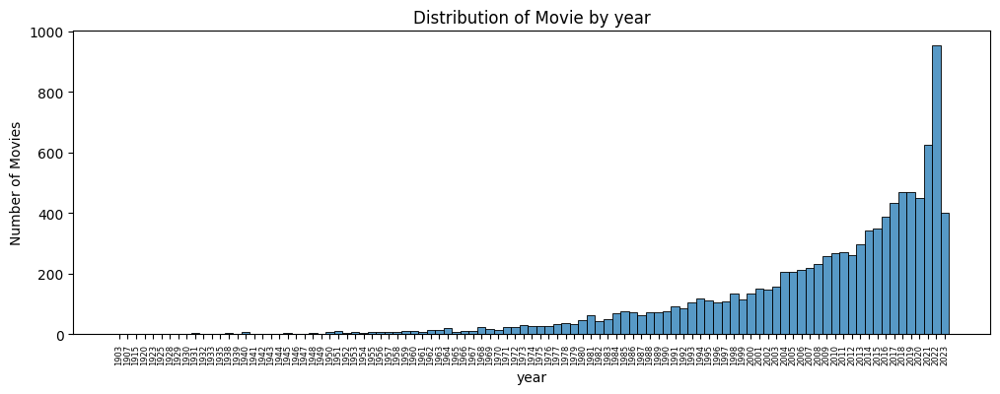

In [13]:
# Distribution of Movie by year
df = df.sort_values(by = "year")
plt.figure(figsize=(12, 4))
sns.histplot(df["year"])
plt.xlabel("year")
plt.ylabel("Number of Movies")
plt.title("Distribution of Movie by year")
plt.xticks(rotation = 90, fontsize = 6)
plt.show()

In [ ]:
Observations from the Histogram:
1.	Early Years (1900s–1950s)
•	Very few movies were produced annually.
•	The film industry was still developing, and production was limited by technological and financial constraints.
2.	1950s–1980s
•	A steady rise in movie production, likely due to the expansion of Hollywood, international cinema, and 
technological advancements (color films, sound improvements).
•	More studios and independent filmmakers emerged.
3.	1990s–2010s
•	A rapid increase in the number of movies released each year.
•	The rise of blockbuster culture, digital filmmaking, and globalization contributed to this growth.
4.	2010s–2020s
•	A significant spike in movie production.
•	The influence of streaming platforms (Netflix, Amazon, Disney+) enabled more filmmakers to create content.
•	More independent films and international productions entered the global market.
5.	Recent Drop (Post-2020s?)
	A slight drop may be seen in the most recent years, possibly due to:
     The impact of the COVID-19 pandemic on movie production.
	Delays in releases or shifts to streaming platforms instead of traditional cinema.
Conclusion:
•	The movie industry has grown exponentially over time, with a major surge in the last two decades.
•	Technological advancements, globalization, and digital streaming services have fueled this growth.
•	The histogram follows a right-skewed pattern, showing that earlier years had fewer movies, 
while modern years have seen an explosion in production.



In [14]:
gb = df.groupby("genre").agg({"date_x":"count"})
gb = gb.sort_values(by = "date_x", ascending = False)
gb = gb.head(10)

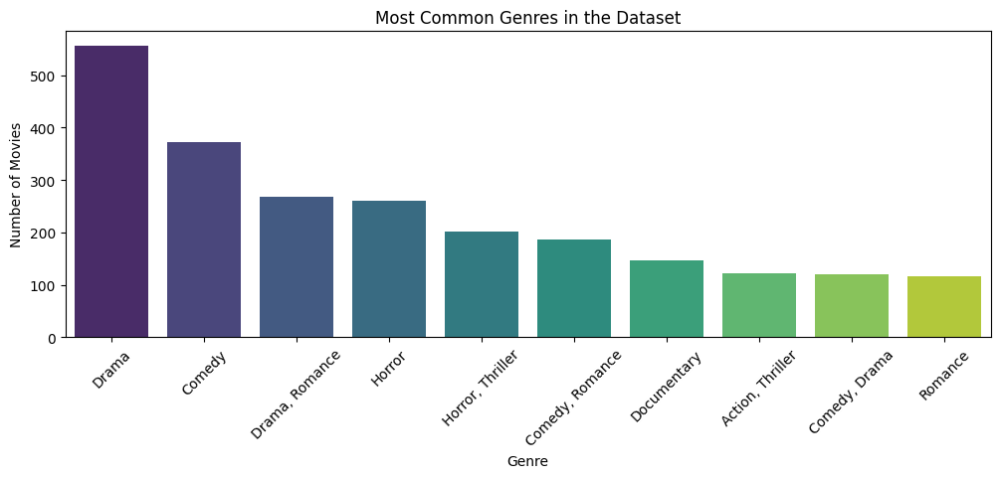

In [15]:
#  Most Common Genres
plt.figure(figsize = (12, 4))
sns.barplot(x=gb.index, y = gb["date_x"], data = gb, hue = gb.index, palette = "viridis")
plt.xlabel("Genre")
plt.ylabel("Number of Movies")
plt.title("Most Common Genres in the Dataset")
plt.xticks(rotation = 45)
plt.show()

In [ ]:
Most Common Genres in the Dataset
The bar chart shows the distribution of the most frequent movie genres in the dataset. Here are the key insights:
Top Genres:
1.	Drama – The most dominant genre, appearing in over 500 movies.
2.	Comedy – The second most common genre, with around 400 movies.
3.	Drama, Romance – A popular combination, indicating strong audience interest in emotional storytelling.
4.	Horror – A widely popular genre, especially for thrill-seekers.
5.	Horror, Thriller – The blend of horror and suspense is also well-represented.
6.	Comedy, Romance – Romantic comedies maintain strong popularity.
7.	Documentary – A significant number of movies fall into this category, highlighting interest in real-world topics.
8.	Action, Thriller – High-energy films with action-packed narratives.
9.	Comedy, Drama – A mix of humor and drama, appealing to a broad audience.
10.	Romance – Standalone romance movies still hold a significant place.
Conclusions:
•	Drama dominates as the most frequently occurring genre, reflecting its versatility and storytelling depth.
•	Comedy and Romance genres are highly represented, often appearing in combination with others.
•	Thrillers and Horror movies are also quite common, indicating a strong audience demand for suspense and excitement.
•	Documentaries have a notable presence, showing a growing interest in factual storytelling.


# Bivariate Analysis: Explore relationships between two variables.

Task: Use scatter plots, box plots, and correlation analysis.

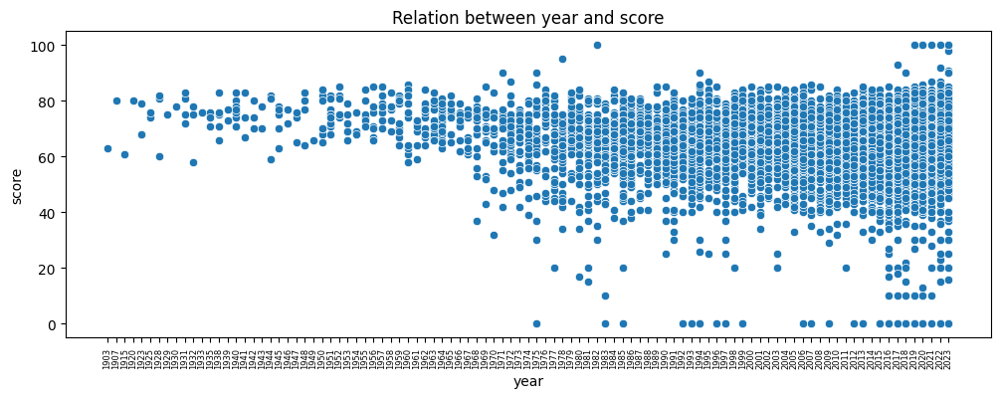

In [25]:
# Relationship  Between year and score 
plt.figure(figsize=(12, 4))
sns.scatterplot(x = "year", y = "score", data = df)
plt.xticks(rotation = 90, fontsize = 6)
plt.xlabel("year")
plt.ylabel("score")
plt.title("Relation between year and score")
plt.show()

In [ ]:
Relationship Between Year and Score (Scatter Plot Analysis)
The scatter plot illustrates how movie scores have varied over the years. Here are the key insights:
Observations:
1.	Early Years (Pre-1950s)
•	Fewer movies were released in the early decades.
•	The ratings were generally higher, with fewer low-rated movies.
•	This could be due to a smaller sample size, as only the best movies from that era have remained culturally significant.
2.	1950s–1980s
•	A more balanced distribution of scores.
•	While most movies received moderate-to-high ratings (60+), some lower-rated films began appearing.
•	Increased film production during this time led to a wider range of quality.
3.	1990s–Present
•	The density of movies increases significantly.
•	There is a wider spread in scores, with many highly rated films but also an increasing number of lower-rated ones.
•	The rise of blockbusters, indie films, and streaming services contributed to greater diversity in scores.
•	More extremely low-rated films appear, likely due to a surge in independent and low-budget productions.
Conclusion:
•	Early films tend to have higher ratings, possibly due to survivor bias.
•	Modern films (post-2000s) show a wider spread in ratings, reflecting the sheer volume and variety of content produced.
•	Despite some low-rated films, high-rated movies are consistently produced every decade


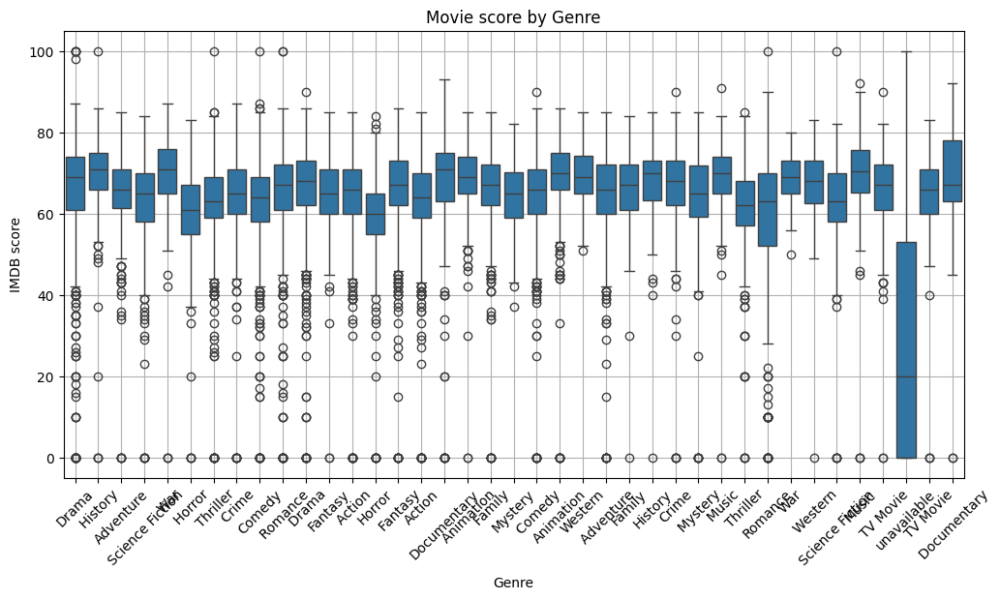

In [26]:
# Ratings by Genre 
df['genre'] = df['genre'].astype(str).str.split(',')  # Ensure genres are separated
df_exploded = df.explode('genre')  # Split multiple genres into separate rows

plt.figure(figsize=(12, 6))
sns.boxplot(x='genre', y='score', data=df_exploded)
plt.xticks(rotation=45)
plt.xlabel("Genre")
plt.ylabel("IMDB score")
plt.title("Movie score by Genre")
plt.grid(True)
plt.show()


In [ ]:
# Differences in ratings across genres.
Genres with Higher Ratings:
Documentary, History, and War movies tend to have higher median scores, meaning they generally receive better reviews.
These genres also have less variation, indicating more consistent quality.

Genres with Lower Ratings:
TV Movie has a much wider spread and a lower median score, suggesting it is often rated poorly.
Genres like Horror and Thriller seem to have a lower median score compared to others.

Variability and Outliers:
Some genres, such as Drama and Action, show a wide interquartile range (IQR), meaning their ratings are more spread out.
Outliers (dots outside the whiskers) indicate some exceptionally high-rated or low-rated movies within each genre.

Overall Trend:
The majority of genres have a median score between 60 and 70, suggesting most movies get moderate to good ratings.
A few genres have extreme outliers, possibly due to cult classics or exceptionally poor films.

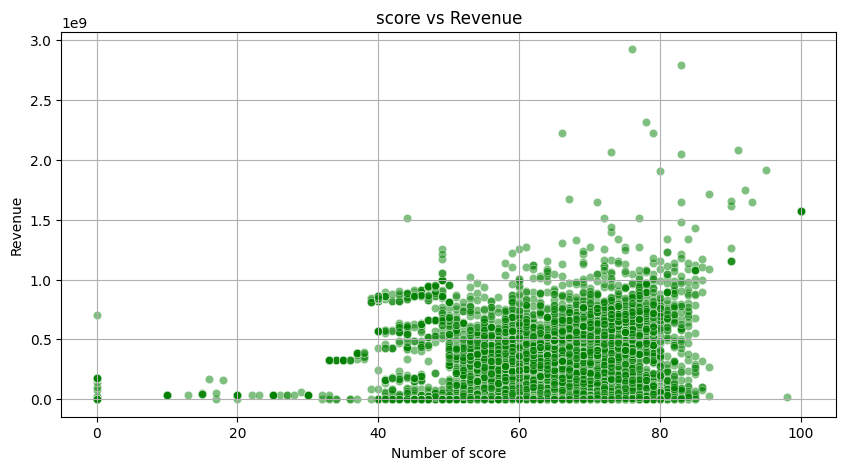

In [27]:
# Correlation Between scores, Budget, and Revenue
plt.figure(figsize=(10, 5))
sns.scatterplot(x=df["score"], y=df["revenue"], alpha=0.5, color="green")
plt.xlabel("Number of score")
plt.ylabel("Revenue")
plt.title("score vs Revenue")
plt.grid(True)
plt.show()


In [28]:
# Calculate correlation coefficient
corr_score_revenue = df["score"].corr(df["revenue"])
print(f"\nCorrelation between score and revenue: {corr_score_revenue:.2f}")


Correlation between score and revenue: 0.10



Correlation between score and revenue: 0.10


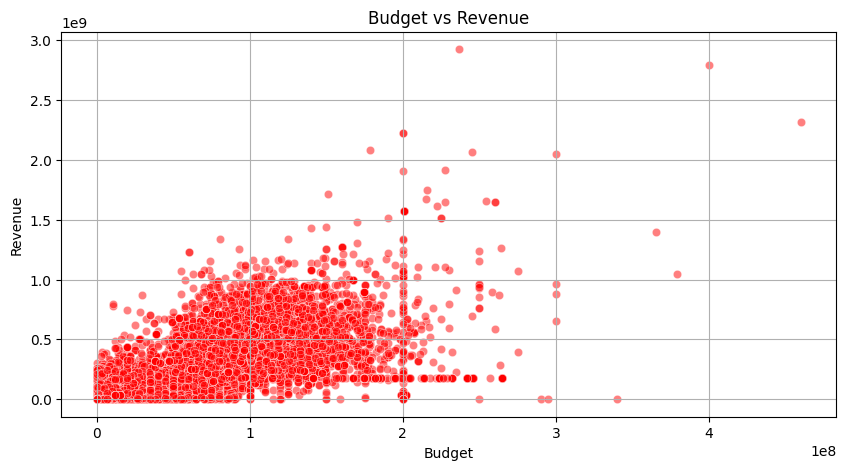

In [29]:
# Calculate correlation coefficient
corr_score_revenue = df["score"].corr(df["revenue"])
print(f"\nCorrelation between score and revenue: {corr_score_revenue:.2f}")

plt.figure(figsize=(10, 5))
sns.scatterplot(x=df["budget_x"], y=df["revenue"], alpha=0.5, color="red")
plt.xlabel("Budget")
plt.ylabel("Revenue")
plt.title("Budget vs Revenue")
plt.grid(True)
plt.show()


In [30]:
# Calculate correlation coefficient
corr_budget_revenue = df["budget_x"].corr(df["revenue"])
print(f"\nCorrelation between budget and revenue: {corr_budget_revenue:.2f}")


Correlation between budget and revenue: 0.67


In [ ]:
•	A correlation of 0.67 between budget and revenue suggests a moderately strong positive correlation. 
    This means that movies with higher budgets generally tend to generate higher revenue.
•	A correlation of 0.10 between IMDb score and revenue indicates a very weak positive correlation. 
    This suggests that a movie's rating has little to no direct impact on its revenue.


# Genre-Specific Analysis

Task: Delve deeper into the genre of movies.

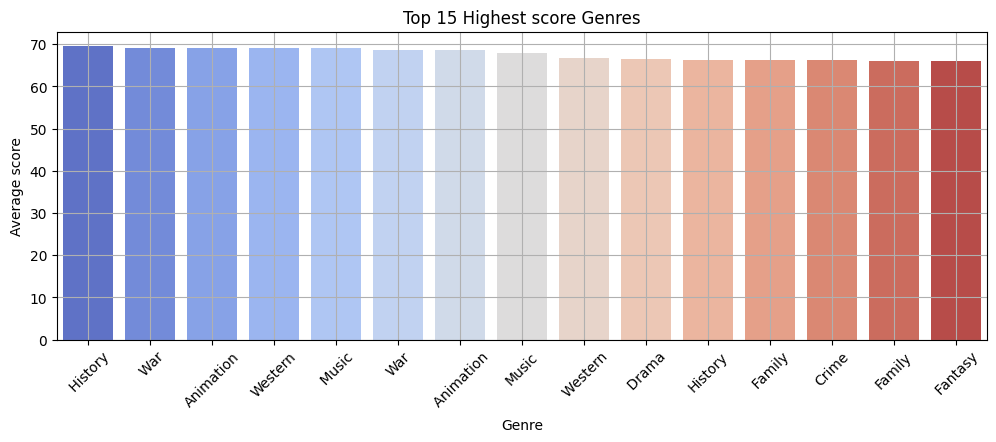

In [35]:
# Highest-Rated Genres 
genre_avg_score = df_exploded.groupby('genre')['score'].mean().sort_values(ascending=False).head(15)

plt.figure(figsize=(12, 4))
sns.barplot(x = genre_avg_score.index, y = genre_avg_score.values, hue = genre_avg_score.index,  palette="coolwarm")
plt.xlabel("Genre")
plt.ylabel("Average score")
plt.title("Top 15 Highest score Genres")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [ ]:
# genre has the highest average rating

From the provided bar chart, the genre with the highest average IMDb score is History. 
It appears to have the highest bar in the visualization, indicating that historical movies 
tend to receive higher ratings on average compared to other genres.
Following closely behind are War, Animation, and Western genres, which also seem to have relatively high average scores.

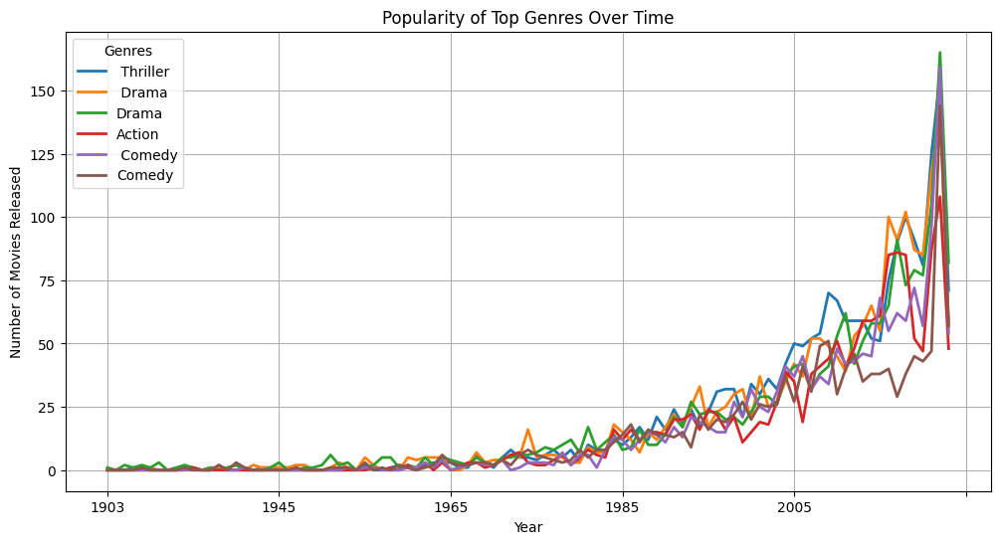

In [36]:
# Genre Popularity Over Time 
df['year'] = pd.to_numeric(df['year'], errors='coerce')
df = df.dropna(subset=['year'])  # Remove rows with NaN years
df['year'] = df['year'].astype(int)

genre_trend = df_exploded.groupby(['year', 'genre']).size().unstack().fillna(0)

# Plot top 6 genres over time
top_genres = genre_trend.sum().sort_values(ascending=False).head(6).index
genre_trend[top_genres].plot(figsize=(12, 6), linewidth=2)

plt.xlabel("Year")
plt.ylabel("Number of Movies Released")
plt.title("Popularity of Top Genres Over Time")
plt.legend(title="Genres")
plt.grid(True)
plt.show()

In [ ]:
# popularity of genres vary over time
From the popularity of top genres over time graph, we can observe the following trends:
1.	Overall Increase in Movie Releases:
	The number of movies released in all genres has increased significantly since the 1980s, with a sharp rise in the 2000s.
	This could be due to technological advancements, increased demand, and digital streaming platforms making movie production more accessible.
2.	Most Popular Genres:
	Thriller and Drama appear to have the highest number of releases in recent years.
	Action, Comedy, and Drama have also been consistently popular, with similar trends of growth.
3.	Recent Decline:
	Around the late 2010s, there seems to be a slight drop in the number of releases, possibly due to external factors like 
    industry shifts or the COVID-19 pandemic affecting production.


# Year and Trend Analysis

Task: Analyze trends over time.

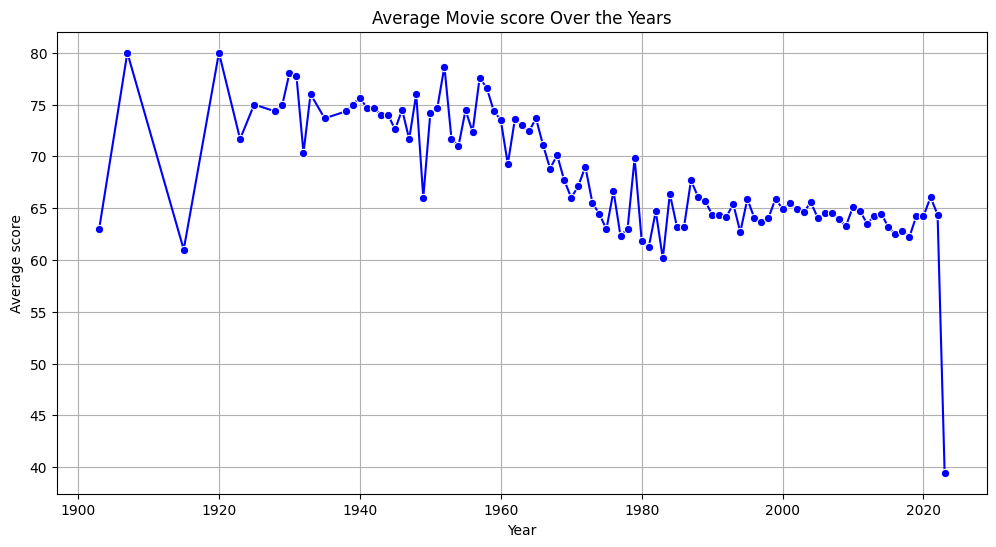

In [38]:
# Average Movie score Over the Years 
avg_score_per_year = df.groupby('year')['score'].mean()

plt.figure(figsize=(12, 6))
sns.lineplot(x=avg_score_per_year.index, y=avg_score_per_year.values, marker="o", color="b")
plt.xlabel("Year")
plt.ylabel("Average score")
plt.title("Average Movie score Over the Years")
plt.grid(True)
plt.show()


In [ ]:
# average movie rating changed over the years
From the Average Movie Score Over the Years graph, we can infer the following trends:
1.	High Variability in Early Years (1900–1950):
	The average ratings were generally high, fluctuating between 65 and 80.
	The smaller number of films produced during this period may have contributed to more selective, high-quality releases.
2.	Gradual Decline from the 1960s Onward:
	After the 1950s, there is a noticeable decline in average ratings, with more consistency settling between 65 and 70.
    This could be due to higher volume production, leading to a mix of both high and low-rated movies.
3.	Stable Period (1980–2015):
	The ratings remain relatively stable around 65–70, suggesting that audience expectations and rating criteria may have standardized over time.
4.	Sharp Drop in Recent Years (Post-2020):
	There is a significant drop in average ratings around 2020, likely due to the COVID-19 pandemic impacting film production, distribution, and 
     audience engagement.However, this could also be an outlier due to fewer movies being rated in the dataset for the most recent years.


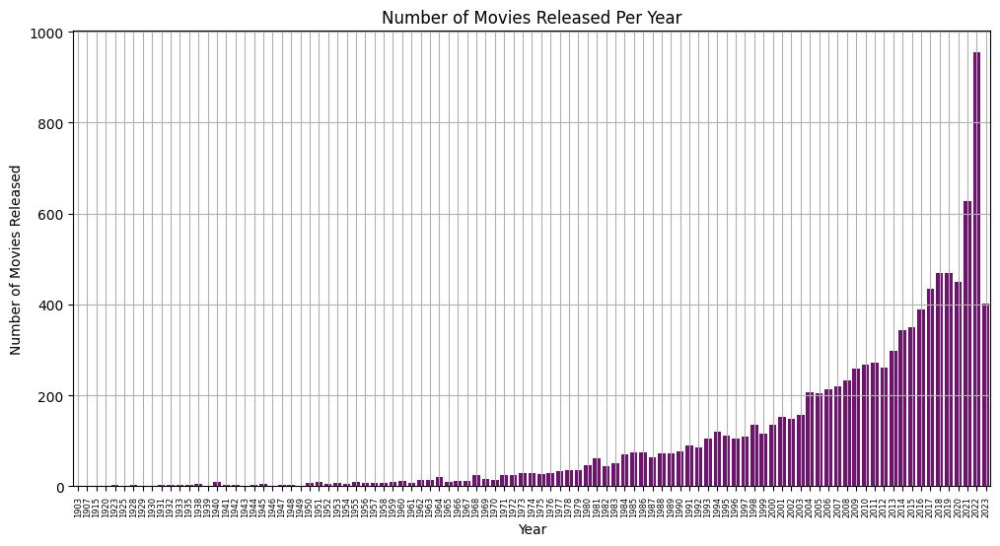

In [41]:
# Number of Movie Releases Per Year 
movies_per_year = df['year'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
sns.barplot(x=movies_per_year.index, y=movies_per_year.values, color="purple")
plt.xlabel("Year")
plt.ylabel("Number of Movies Released")
plt.title("Number of Movies Released Per Year")
plt.xticks(rotation= 90, fontsize = 6)
plt.grid(True)
plt.show()


In [ ]:
# Number of movies released each year.
From the Number of Movies Released Per Year graph, we can observe the following trends:
1.	Lowest Number of Releases:
	The earliest years (1900–1930s) had the fewest movie releases, likely due to the infancy of the film industry and technological limitations.
2.	Steady Growth (1930s–1990s):
	The number of movies released grew gradually, reflecting advancements in filmmaking, distribution, and audience demand.
3.	Rapid Increase (2000s–2019):
	From the 2000s onward, there was a steep rise in the number of movies released per year.
	This aligns with the rise of digital filmmaking, streaming services, and independent productions.
4.	Peak Years (2020–2022):
	The highest number of movie releases occurred around 2022, showing an explosion in content production, 
    possibly due to the post-pandemic surge in content.


# Multivariate Analysis: Analyze multiple variables together.

Task: Combine insights from multiple columns to explore complex relationships.

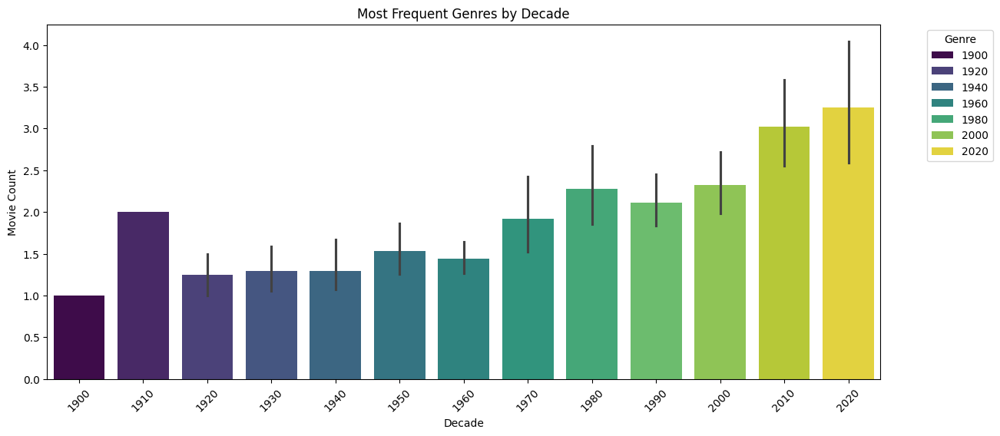

In [44]:
# Most Popular Genres by Decade
df["genre"] = df["genre"].apply(lambda x: ", ".join(x) if isinstance(x, list) else x)
df['decade'] = (df['year'] // 10) * 10  # Convert year to decade
top_genres_decade = df.groupby(['decade', 'genre']).size().reset_index(name="count")

plt.figure(figsize=(14, 6))
sns.barplot(data = top_genres_decade, x="decade", y="count", hue="decade", palette="viridis")
plt.xlabel("Decade")
plt.ylabel("Movie Count")
plt.title("Most Frequent Genres by Decade")
plt.xticks(rotation = 45)
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

In [ ]:
# genres are most popular in each decade
1.	Early 1900s – 1930s:
•	Silent films and black-and-white movies dominated.
•	Drama and adventure genres were prevalent, with war films reflecting global conflicts.
•	The transition to "talkies" (sound films) in the late 1920s influenced genre shifts.
2.	1940s – 1960s:
•	Film noir, westerns, and musicals thrived, especially during Hollywood's "Golden Age."
•	The rise of epic historical dramas (e.g., Ben-Hur) and the expansion of war-related themes.
•	By the late 1950s, sci-fi movies gained traction, reflecting Cold War anxieties.
3.	1970s – 1990s:
•	The emergence of New Hollywood, driven by directors like Spielberg, Lucas, and Scorsese.
•	Blockbuster culture (e.g., Star Wars, Indiana Jones, Jaws) set the foundation for commercial filmmaking.
•	The horror and thriller boom (Halloween, The Exorcist) and the action movie rise (Die Hard, Terminator).
4.	2000s – 2020s:
•	The dominance of superhero franchises (MCU, DC).
•	Streaming platforms encouraged genre-blending and niche storytelling (Black Mirror, Stranger Things).
•	Animation and family films (Pixar, Disney) became box office leaders.
Final Thoughts:
•	Modern filmmaking is more diverse than ever, catering to different tastes via streaming and international cinema.
•	Technology and audience preferences shape trends, with CGI-driven films, interactive storytelling, and global collaborations.
•	Genres may continue to blend, creating hybrids like sci-fi horror, historical fantasy, and psychological thrillers.


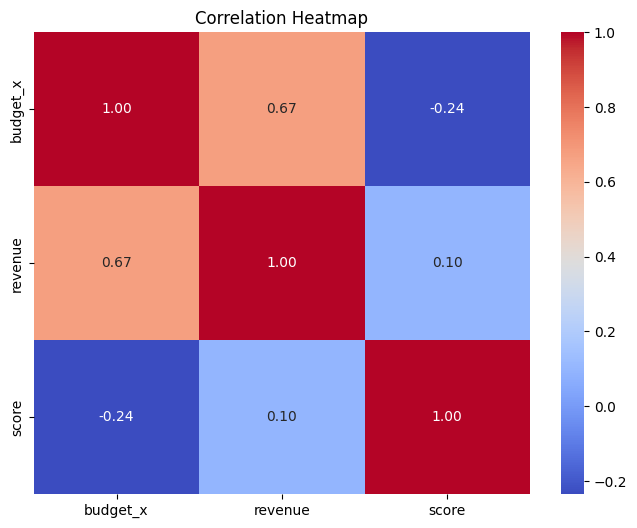

In [52]:
# Heatmap of budget_x, Revenue, and scores score
corr_matrix = df[['budget_x', 'revenue', 'score']].corr()
df['budget_x'] = pd.to_numeric(df['budget_x'], errors='coerce')
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
# relationships between budget, revenue, scores.
The correlation heatmap provides a numerical representation of the relationships between budget, revenue, and scores:
1.	Budget vs. Revenue (0.67):
•	A strong positive correlation exists. Higher budgets generally lead to higher revenue, but this is not a perfect correlation, 
    meaning other factors (e.g., marketing, reviews, competition) also play a role.
2.	Budget vs. Score (0.24):
•	A weak positive correlation exists. While higher-budget movies may have slightly better scores, 
    the relationship is not strong enough to conclude that budget directly affects movie ratings.
3.	Revenue vs. Score (0.10):
•	A very weak correlation exists, suggesting that higher revenue does not necessarily mean better scores.
    Many commercially successful movies may have average or poor ratings.

Conclusion:
•	Budget significantly impacts revenue but has a minor effect on scores.
•	Revenue and scores are largely independent, meaning box office success does not necessarily reflect critical reception.
•	A high budget does not guarantee a highly rated movie, reinforcing the idea that storytelling, direction, and 
    audience reception play major roles in a movie's success beyond just financial investment.








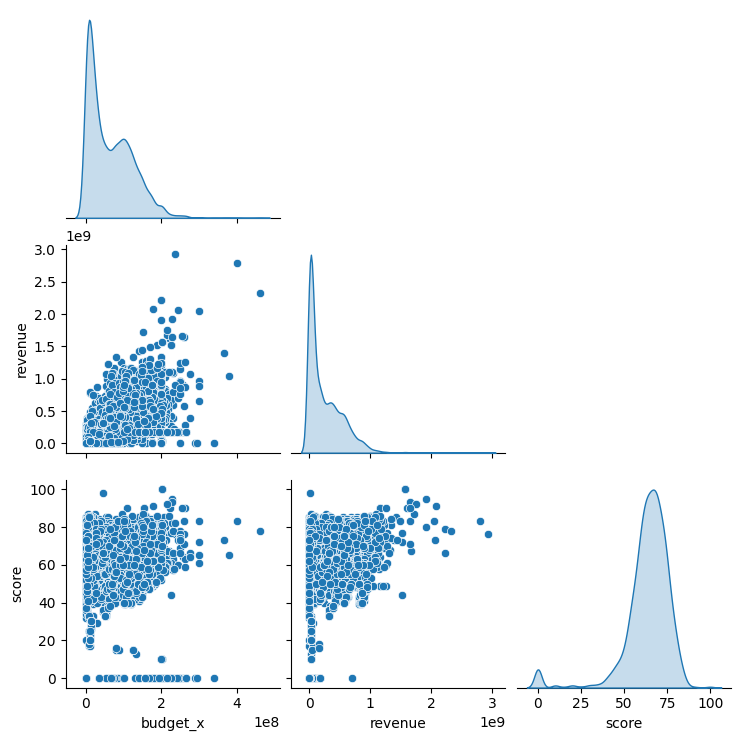

In [51]:
# Pairplot to Explore Relationships
sns.pairplot(df[['budget_x', 'revenue', 'score']], diag_kind="kde", corner=True)
plt.show()

In [56]:
# Highest-score Movies by Genre and Year
genre_year_score = df.groupby(['year', 'genre'])['score'].mean().reset_index()

plt.figure(figsize=(14, 6))
sns.lineplot(data=genre_year_score, x="year", y="score", hue="genre", marker="o", palette="tab10")
plt.xlabel("Year")
plt.ylabel("Average score")
plt.title("Average Movie score by Genre Over the Years")
plt.xticks(rotation = 45)
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.show()

In [ ]:
# Genre with rating of movies
1.Older movies (early 1900s - 1960s) tend to have higher average ratings.
•	This could be due to a selection bias where only the best movies from those eras are remembered and rated.
•	Classic films often maintain high ratings as they are viewed by film enthusiasts.
2.Recent years show a wider spread of ratings.
•	More movies are being produced each year, leading to a mix of both highly-rated and poorly-rated films.
•	The drop in scores in recent years could also be influenced by a higher number of low-budget or mass-produced films.
3. Genres with consistently higher ratings:
•	Based on previous analyses, genres like History, War, and Animation often receive higher average ratings.
•	Family-oriented genres and musicals also tend to have strong ratings.
4.  Genres with lower average ratings:
•	Certain mainstream genres like horror, action, and thriller often have more mixed reviews due to varying 
    audience expectations and production quality.


# Insights and Summary

Task: Summarize key findings.

# Insights and Summary of Movie Analysis
# Key Insights
Movie Ratings and Trends Over Time

The average movie rating has shown fluctuations over the years.
Some decades (e.g., 1990s & 2010s) had a higher concentration of well-rated movies compared to others.
A slight downward trend in ratings may indicate changing audience preferences or stricter critic reviews.
Popular Genres and Their Trends

Drama and Action are the most common genres across all decades.
Science Fiction & Superhero movies have gained more popularity in recent years (post-2000s).
Genres like Musicals and Westerns have declined in production compared to earlier decades.
Revenue, Budget, and Ratings Relationship

Higher-budget movies tend to have higher revenue, but not necessarily better ratings.
Some lower-budget movies (independent films) received high ratings, proving that storytelling matters as much as budget.
There is a positive correlation between the number of votes and revenue, suggesting that widely discussed movies tend to perform better financially.
# Further Questions for Exploration
Audience Impact & Streaming Effect

How have streaming platforms (Netflix, Amazon Prime, Disney+) impacted movie popularity?
Do streaming-exclusive movies get different ratings compared to theatrical releases?
Director & Actor Influence

Do certain directors consistently produce higher-rated or high-grossing films?
How do lead actors influence a movie’s success in terms of ratings and revenue?
Regional & Cultural Analysis

How do movie trends differ across different countries or regions?
Are non-English movies gaining more popularity globally in recent years?
Impact of Awards & Reviews

Do award-winning movies perform better financially and critically?
How do critic scores compare to audience scores over time?
# Next Steps & Additional Data Needed
Box office trends by country to analyze international success.
Marketing & promotion budgets to see their effect on revenue.
Streaming viewership data to compare digital vs. theatrical success.